In [1]:
from transformers import CLIPModel
from PIL import Image 
import numpy as np 
from matplotlib import pyplot as plt 
import os 
import torch
from clip_dataset.retrieval_dataset import CLIPDataset,RetrievalTransformPipeline
from torch.utils.data import DataLoader
from tqdm import tqdm 
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# path config:
checkpoint = '/cfsdata2/cfsdata/workspace/yunzhi/checkpoint/clip'
data_root ='/cfsdata2/cfsdata/workspace/yunzhi/data/clip_real_value'
work_dir = '/cfsdata2/cfsdata/workspace/yunzhi/clip_retrieval/work_dir/demo'
embeds_cache_path = os.path.join(work_dir, 'embeds_cache.pt')
if not os.path.exists(work_dir):
    os.mkdir(work_dir)

# build transforms:
truncation = 'only_first'
pipeline = RetrievalTransformPipeline(checkpoint=checkpoint,keys=['text'],truncation=truncation)

# build dataset & dataloader
batch_size = 12
test_mode = True
sampling_limit = 1000
shuffle = False
dataset = CLIPDataset(data_root=data_root,      # 
                        pipeline=pipeline,      
                        test_mode=test_mode,          # 
                        sampling_limit=sampling_limit,      # 每个数据批次取1000张图片
                        shuffle=shuffle,
                        debug=False)
dataloader = DataLoader(dataset=dataset,  batch_size=batch_size, shuffle=shuffle, collate_fn=pipeline.collate_fn)
print(f"dataset len:{len(dataset)}")

# build CLIP model:
device = 0
model = CLIPModel.from_pretrained(checkpoint)
model = model.cuda(device)
model.eval()
pass

Model loaded succeed
get:  /cfsdata2/cfsdata/workspace/yunzhi/data/clip_real_value/cache/0.json
get:  /cfsdata2/cfsdata/workspace/yunzhi/data/clip_real_value/cache/1.json
get:  /cfsdata2/cfsdata/workspace/yunzhi/data/clip_real_value/cache/2.json
get:  /cfsdata2/cfsdata/workspace/yunzhi/data/clip_real_value/cache/158.json
get:  /cfsdata2/cfsdata/workspace/yunzhi/data/clip_real_value/cache/188.json
dataset len:4193


In [3]:
def to_cuda(data):
    for k in data:
        if isinstance(data[k], torch.Tensor):
            data[k] = data[k].cuda()
    return data
with torch.no_grad():
    for data in dataloader:
        data = to_cuda(data)
        out = model(**data)
        break
print("batch张图片的模长:",torch.norm(out.image_embeds,'fro',dim=1))

batch张图片的模长: tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000], device='cuda:0')


In [4]:
embeds_cache = []
if not os.path.exists(embeds_cache_path):
    with torch.no_grad():
        for data in tqdm(dataloader,desc="Generate image embeds"):
            # to model's GPU:
            images = data['pixel_values']
            images = images.to(model.device)

            # get embedding & frobenius norm to 1
            out = model.get_image_features(images)
            out /= out.norm(p=2,dim=-1, keepdim=True)
            embeds_cache.append(out)
    embeds_cache = torch.cat(embeds_cache, dim=0)
    print(f"save embeds_cache at {embeds_cache_path}")
    torch.save(embeds_cache, embeds_cache_path)
else:
    print(f"load embeds cache at {embeds_cache_path}")
    embeds_cache = torch.load(embeds_cache_path).to(model.device)
print("embeds_cache shape:", embeds_cache.shape)
assert embeds_cache.shape == (len(dataset), 512)    # dataset所有的图片都被嵌入到了512维度
assert embeds_cache.norm(p=2, dim=-1).sum().cpu().long().item() == len(dataset)    # 所有的representation模长为1

load embeds cache at /cfsdata2/cfsdata/workspace/yunzhi/clip_retrieval/work_dir/demo/embeds_cache.pt
embeds_cache shape: torch.Size([4193, 512])


## 可视化需要查询的图片

Index of query of image in dataset: 2153
{'text': '实线_1_黄色_有效车道线', 'key_points': [[222.0410309016, 2160], [1498.4035164923, 1400.4043419062], [1716.9889553891, 1271.0892951952], [1867.4910610663, 1182.9907480721], [1922.3063630669, 1148.1312472606], [1935.9470372974, 1139.542674597]], 'bbox': None}
实线_1_黄色_有效车道线
{'text': '长虚线_2_白色_有效车道线', 'key_points': [[2627.4450137183, 2160], [2188.3238297492, 1397.4084385841], [2080.4875705573, 1230.6822968527], [2042.7719483267, 1170.4730344126], [2022.7740462912, 1139.5289123155]], 'bbox': None}
长虚线_2_白色_有效车道线
{'text': '长虚线_4_白色_有效车道线', 'key_points': [[3840, 1743.6716757597], [2381.0994698679, 1231.0904113677], [2334.872740531, 1215.176291432], [2247.2187783457, 1186.6319175792], [2207.5597810457, 1173.4964535053], [2145.9241419299, 1151.5198116894], [2109.0438004917, 1139.3947679289]], 'bbox': None}
长虚线_4_白色_有效车道线
{'text': '墙或花坛型边沿_1', 'key_points': [[0, 2113.4018640707], [1561.2142947633, 1326.2815890641], [1748.0285969481, 1229.5753521741], [19

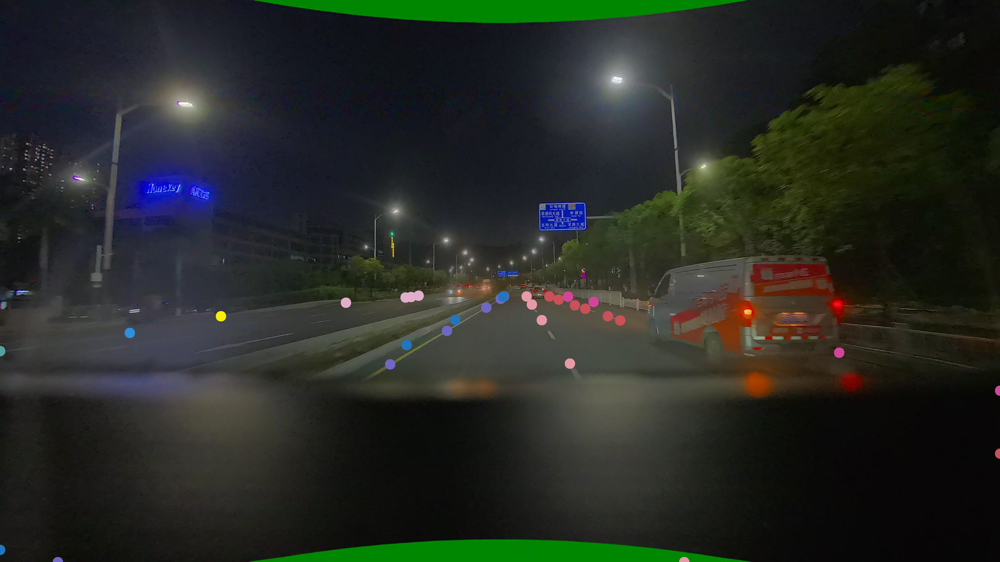

In [5]:
query_key = np.random.randint(len(dataset))
print(f"Index of query of image in dataset: {query_key}")
dataset.vis_data(query_key)

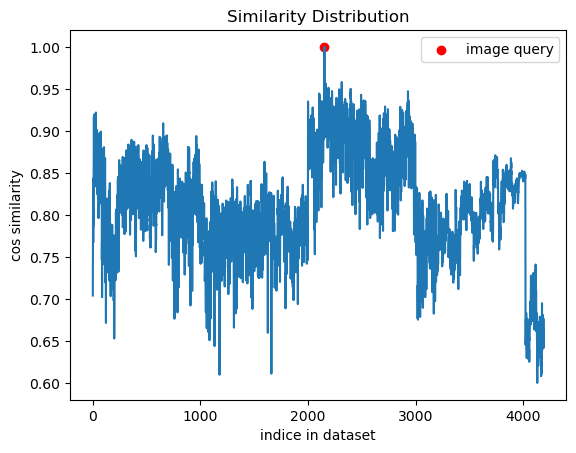

In [6]:
cos_sims = embeds_cache[query_key] @ embeds_cache.t()
cos_sims = cos_sims.cpu().numpy()

y = cos_sims
x = np.arange(len(y))

plt.plot(x,y)
plt.scatter(query_key, cos_sims[query_key],color='red',label='image query')
plt.legend()
plt.title('Similarity Distribution')
plt.xlabel('indice in dataset')
plt.ylabel('cos similarity')
plt.show()

## 按照余弦相似度排序

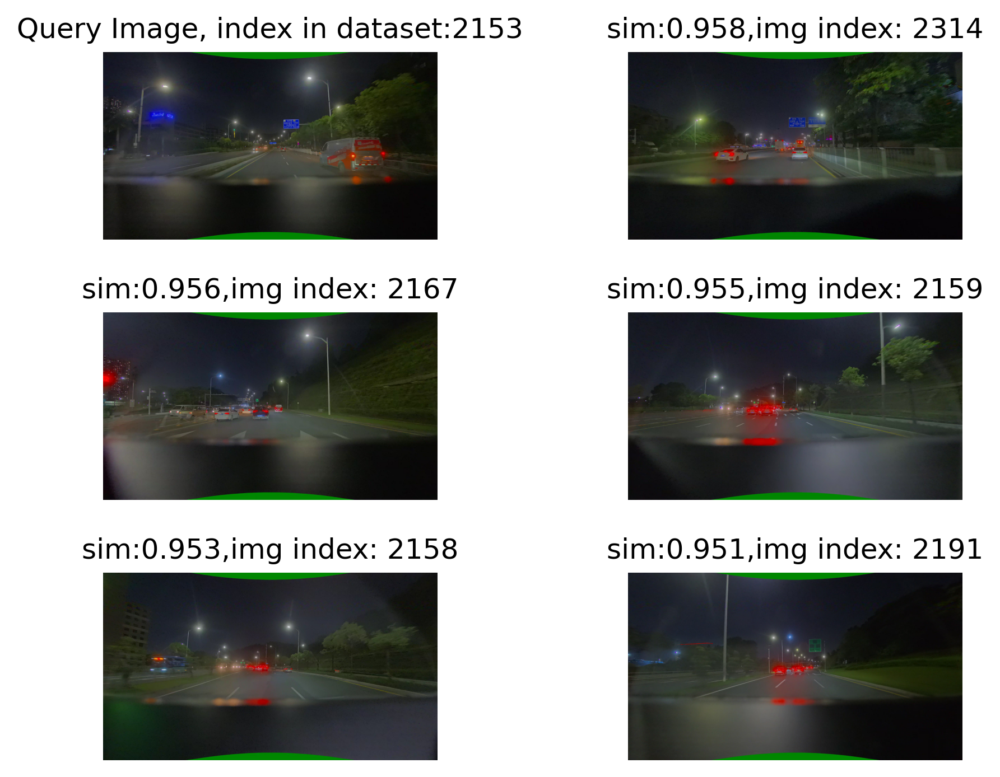

In [7]:
# 查看相似度最高的top-K图像
top_k = 6
rank = sorted(x, key=lambda _x: cos_sims[_x],reverse=True)
query_result = y[rank]

# get result images:
result_imgs = []
for i in rank[:top_k]:
    result_imgs.append(dataset.imread(i))

columns = 2
dpi=300
fig, axes = plt.subplots(top_k//columns, columns,dpi=dpi)
fig.tight_layout()
for row in range(top_k//columns):
    for col in range(columns):
        axes[row,col].imshow(result_imgs[columns * row + col])
        if row==0 and col == 0:
            axes[row,col].set_title(f'Query Image, index in dataset:{query_key}')
        else:
            axes[row,col].set_title('sim:{:.3f},img index: {}'.format(query_result[columns * row + col], rank[columns * row + col]))
        axes[row,col].axis('off')


## 查找和query image余弦相似度近似为thr的图片

index in dataset: 2929, cos similarity 0.9150024056434631 > 0.915


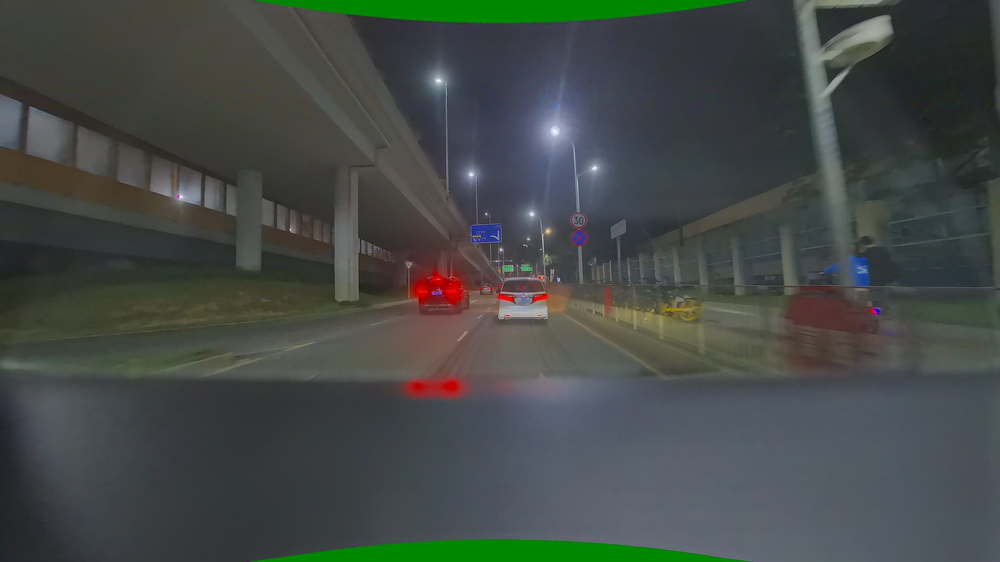

In [8]:
thr = 0.915
if thr < query_result[-1]:
    thr = query_result[-2]
    print(f"similarity should in [{query_result[-1]},1), replace thr=={thr} with {query_result[-2]}")
    
# binary search:
def binary_search(_query_result,_thr):
    assert _thr > 0 and _thr < 1
    value = list(_query_result > _thr)
    l = -1
    r = len(value)
    while l + 1 != r:
        mid = (l + r) >> 1
        if value[mid]:
            l = mid 
        else:
            r = mid
    if l == -1 or l == 0 or r == len(value) or r == 0:
        raise ValueError
    return l
rank_index = binary_search(query_result, thr)
assert query_result[rank_index-1] > thr and query_result[rank_index+1] <= thr 
index_in_dataset = rank[rank_index]

print(f"index in dataset: {index_in_dataset}, cos similarity {query_result[rank_index]} > {thr}")
Image.fromarray(dataset.imread(index_in_dataset))


{'text': '其他边沿_1', 'key_points': [[376.4397454354, 2160], [1488.0909752345, 1416.9829853001], [1781.9592394345, 1226.3292434116]], 'bbox': None}
其他边沿_1
{'text': '栅栏型边沿_1', 'key_points': [[1812.4821261947, 1203.9233071464], [1781.9592394345, 1226.3292434116]], 'bbox': None}
栅栏型边沿_1
{'text': '虚线_栅栏型边沿_1', 'key_points': [[1873.5446225754, 1164.3035917548], [1812.4821261947, 1203.9233071464]], 'bbox': None}
虚线_栅栏型边沿_1
{'text': '其他边沿_3', 'key_points': [[0, 1516.6195077677], [1210.8746548324, 1267.029927723], [1484.6944816036, 1227.6386846281], [1710.0717686129, 1172.4257749591]], 'bbox': None}
其他边沿_3
{'text': '虚线_其他边沿_2', 'key_points': [[3252.3041433375, 2160], [2198.857051581, 1252.7534266849]], 'bbox': None}
虚线_其他边沿_2
{'text': '其他边沿_2', 'key_points': [[2069.5341362016, 1169.3155569093], [2198.857051581, 1252.7534266849]], 'bbox': None}
其他边沿_2
CAPTION: 其他边沿_1 栅栏型边沿_1 虚线_栅栏型边沿_1 其他边沿_3 虚线_其他边沿_2 其他边沿_2 


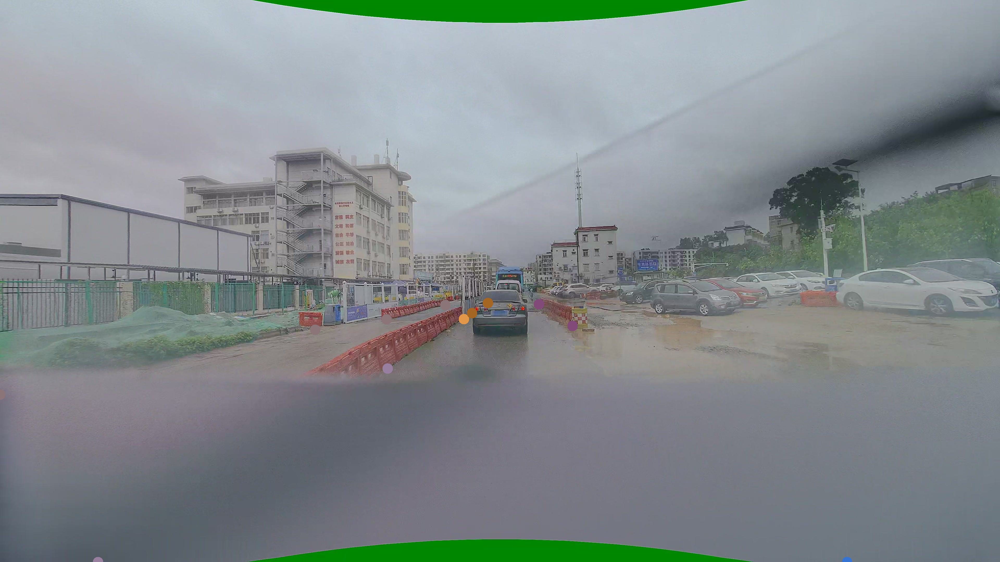

In [9]:
dataset.vis_data(769)